In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = None

transaction = pd.read_csv("../8th_week/data/train2.csv")
transaction.head()

,TripType,VisitNumber,Weekday,Upc,ScanCount,DepartmentDescription,FinelineNumber
0,999,5,Friday,6.811315e+10,-1,FINANCIAL SERVICES,1000.0
1,30,7,Friday,6.053882e+10,1,SHOES,8931.0
2,30,7,Friday,7.410811e+09,1,PERSONAL CARE,4504.0
3,26,8,Friday,2.238404e+09,2,PAINT AND ACCESSORIES,3565.0
4,26,8,Friday,2.006614e+09,2,PAINT AND ACCESSORIES,1017.0


In [2]:
transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 647054 entries, 0 to 647053
Data columns (total 7 columns):
TripType                 647054 non-null int64
VisitNumber              647054 non-null int64
Weekday                  647054 non-null object
Upc                      642925 non-null float64
ScanCount                647054 non-null int64
DepartmentDescription    645693 non-null object
FinelineNumber           642925 non-null float64
dtypes: float64(2), int64(3), object(2)
memory usage: 34.6+ MB


In [3]:
transaction.describe()

,TripType,VisitNumber,Upc,ScanCount,FinelineNumber
count,647054.000000,647054.000000,6.429250e+05,647054.000000,642925.000000
mean,58.584511,96167.640078,3.060698e+10,1.108878,3726.884567
std,157.635533,55545.485154,9.120134e+10,0.700776,2780.966158
min,3.000000,5.000000,8.340000e+02,-12.000000,0.000000
25%,27.000000,49268.000000,3.400001e+09,1.000000,1404.000000
50%,39.000000,97074.000000,7.050103e+09,1.000000,3352.000000
75%,40.000000,144316.000000,3.006531e+10,1.000000,5501.000000
max,999.000000,191347.000000,9.789707e+11,71.000000,9998.000000


### TripType 
- 수가 많은 타입. 37~40 인 경우를 합치면 전체 data의 50%정도
해당 품목들을 주로샀음. 상위 3개품목을 비교해보면 조금씩 차이남

GROCERY DRY GOODS	DSD GROCERY	DAIR<br>
GROCERY DRY GOODS	DSD GROCERY	PERSONAL CARE<br>
PRODUCE	GROCERY DRY GOODS	DAIRY<br>
DAIRY	GROCERY DRY GOODS	DSD GROCERY<br>

- 수가 작은 타입. 14, 23, 4 
확실히 주로 산 품목이 뚜렷하게 차이가 남
구매가 물건의 갯수가 적긴하지만 해당 품목을 산 경우 special care가 필요해보임
FABRICS AND CRAFTS	IMPULSE MERCHANDISE	CELEBRATION
PLAYERS AND ELECTRONICS	MEDIA AND GAMING	DSD GROCERY
PHARMACY OTC	DSD GROCERY	IMPULSE MERCHANDISE

- 기타 타입. 999
반품을 한 경우, 구매후 당일 바로 반품한 경우 visitNumber, Upc까지 동일함

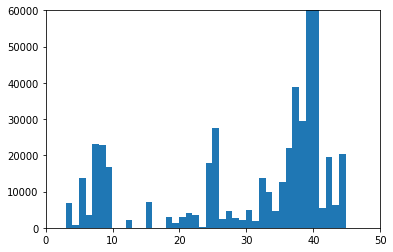

In [4]:
# transaction_normal = transaction[TripType != 999]
plt.hist(transaction.TripType, bins=1000)
plt.axis([0, 50, 0, 60000])
plt.show()

In [5]:
transaction.TripType.value_counts()

40     174164
39      95504
37      38954
38      29565
25      27609
7       23199
8       22844
36      21990
44      20424
42      19468
24      18015
999     17590
9       16820
32      13843
5       13836
35      12501
33       9918
15       7147
3        6827
43       6383
41       5508
30       4861
34       4751
27       4613
21       4032
22       3592
6        3405
20       3116
18       2977
28       2664
26       2507
12       2108
29       2105
31       1765
19       1188
4         901
23        325
14         35
Name: TripType, dtype: int64

In [6]:
df_tran = transaction.groupby(['TripType', 'DepartmentDescription'], as_index="TripType")['ScanCount'].sum()
df_tran = df_tran.unstack("DepartmentDescription", fill_value=0)
df_tran

DepartmentDescription,1-HR PHOTO,ACCESSORIES,AUTOMOTIVE,BAKERY,BATH AND SHOWER,BEAUTY,BEDDING,BOOKS AND MAGAZINES,BOYS WEAR,BRAS & SHAPEWEAR,CAMERAS AND SUPPLIES,"CANDY, TOBACCO, COOKIES",CELEBRATION,COMM BREAD,CONCEPT STORES,COOK AND DINE,DAIRY,DSD GROCERY,ELECTRONICS,FABRICS AND CRAFTS,FINANCIAL SERVICES,FROZEN FOODS,FURNITURE,"GIRLS WEAR, 4-6X AND 7-14",GROCERY DRY GOODS,HARDWARE,HEALTH AND BEAUTY AIDS,HOME DECOR,HOME MANAGEMENT,HORTICULTURE AND ACCESS,HOUSEHOLD CHEMICALS/SUPP,HOUSEHOLD PAPER GOODS,IMPULSE MERCHANDISE,INFANT APPAREL,INFANT CONSUMABLE HARDLINES,JEWELRY AND SUNGLASSES,LADIES SOCKS,LADIESWEAR,LARGE HOUSEHOLD GOODS,LAWN AND GARDEN,"LIQUOR,WINE,BEER",MEAT - FRESH & FROZEN,MEDIA AND GAMING,MENS WEAR,MENSWEAR,OFFICE SUPPLIES,OPTICAL - FRAMES,OPTICAL - LENSES,OTHER DEPARTMENTS,PAINT AND ACCESSORIES,PERSONAL CARE,PETS AND SUPPLIES,PHARMACY OTC,PHARMACY RX,PLAYERS AND ELECTRONICS,PLUS AND MATERNITY,PRE PACKED DELI,PRODUCE,SEAFOOD,SEASONAL,SERVICE DELI,SHEER HOSIERY,SHOES,SLEEPWEAR/FOUNDATIONS,SPORTING GOODS,SWIMWEAR/OUTERWEAR,TOYS,WIRELESS
TripType,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3,2,2,22,5,8,24,4,4,9,0,5,25,17,4,2,10,11,56,14,8,5829,7,1,2,12,11,0,2,16,0,5,5,801,2,11,8,0,4,76,9,10,1,10,35,3,12,1,0,0,4,41,11,47,0,1,1,0,21,0,0,13,0,6,2,16,2,6,3
4,0,1,3,15,0,7,0,0,0,0,0,10,3,9,0,1,12,87,0,0,5,7,0,1,24,1,0,2,4,4,5,18,50,0,0,1,0,0,0,0,0,1,0,3,0,3,0,0,0,2,31,2,669,4,0,0,2,37,0,0,9,0,1,0,2,0,2,0
5,1,16,45,79,28,246,7,15,15,9,2,153,87,112,0,67,274,717,16,76,50,131,0,13,480,45,0,36,67,18,151,129,579,9,33,24,16,35,0,77,39,17,12,78,1,107,479,87,0,10,1031,115,6272,2727,0,1,26,446,3,1,106,6,40,15,38,0,22,7
6,5,2,5,25,6,23,3,2,1,0,0,807,35,41,0,15,94,428,0,11,15,102,0,1,187,8,0,5,15,5,59,62,248,2,3,2,0,12,0,18,1218,26,3,9,0,18,0,0,1,4,71,38,53,0,0,0,28,144,4,1,57,0,11,4,10,0,3,1
7,1,9,36,1144,5,79,6,15,6,2,0,152,52,1655,0,66,1407,2330,13,33,65,2922,1,12,4444,36,0,28,31,12,227,267,668,5,53,12,3,30,0,58,88,1799,5,43,0,45,3,0,1,17,215,69,166,2,3,2,1035,3171,427,0,3956,4,29,8,32,3,18,11
8,0,6,59,488,28,1122,4,15,12,4,0,627,98,495,0,44,1892,5013,7,38,0,449,0,14,1647,46,0,16,55,11,1019,717,2557,14,398,24,4,35,0,21,46,25,5,23,1,81,3,0,0,18,2711,565,638,8,1,2,64,1977,2,0,208,3,46,9,30,9,25,4
9,91,171,969,63,216,154,132,99,281,158,67,118,740,56,0,404,132,563,500,358,61,53,21,170,120,638,0,274,496,222,106,74,1356,176,180,451,63,654,0,455,10,5,238,1396,48,766,2,0,1,221,327,40,222,3,98,33,12,179,0,1,71,56,626,167,658,54,588,277
12,0,0,4,23,18,20,2,1,3,2,0,15,30,134,0,38,108,342,6,2,7,25,0,7,276,9,0,3,11,0,54,377,87,6,5,1,0,7,0,288,18,81,1,6,0,20,1,0,0,5,63,13,41,0,0,0,77,128,5,1,18,0,13,2,14,2,74,0
14,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,64,2,0,0,0,0,0,0,0,0,0,0,1,5,0,0,0,0,0,0,0,0,0,2,0,0,1,0,0,0,0,0,3,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0


In [7]:
# df_tran.loc[df_tran.index.isin(['40','39','37','38'])]
df_tran_40 = df_tran.loc[df_tran.index.isin(['40'])]
df_tran_39 = df_tran.loc[df_tran.index.isin(['39'])]
df_tran_37 = df_tran.loc[df_tran.index.isin(['37'])]
df_tran_38 = df_tran.loc[df_tran.index.isin(['38'])]
df_tran_24 = df_tran.loc[df_tran.index.isin(['24'])]



df_tran_40.T.nlargest(3, df_tran_40.T.columns).T

DepartmentDescription,GROCERY DRY GOODS,DSD GROCERY,DAIRY
TripType,,,
40,42450,26515,20426


In [8]:
df_tran_39.T.nlargest(3, df_tran_39.T.columns).T

DepartmentDescription,GROCERY DRY GOODS,DSD GROCERY,PERSONAL CARE
TripType,,,
39,15481,14828,8595


In [9]:
df_tran_37.T.nlargest(3, df_tran_37.T.columns).T

DepartmentDescription,PRODUCE,GROCERY DRY GOODS,DAIRY
TripType,,,
37,13797,6718,4214


In [10]:
df_tran_38.T.nlargest(3, df_tran_38.T.columns).T

DepartmentDescription,DAIRY,GROCERY DRY GOODS,DSD GROCERY
TripType,,,
38,8844,8049,4685


In [11]:
df_tran_14 = df_tran.loc[df_tran.index.isin(['14'])]
df_tran_23 = df_tran.loc[df_tran.index.isin(['23'])]
df_tran_4 = df_tran.loc[df_tran.index.isin(['4'])]

df_tran_14.T.nlargest(3, df_tran_14.T.columns).T

DepartmentDescription,FABRICS AND CRAFTS,IMPULSE MERCHANDISE,CELEBRATION
TripType,,,
14,64,5,3


In [12]:
df_tran_23.T.nlargest(3, df_tran_23.T.columns).T

DepartmentDescription,PLAYERS AND ELECTRONICS,MEDIA AND GAMING,DSD GROCERY
TripType,,,
23,107,67,17


In [13]:
df_tran_4.T.nlargest(3, df_tran_4.T.columns).T

DepartmentDescription,PHARMACY OTC,DSD GROCERY,IMPULSE MERCHANDISE
TripType,,,
4,669,87,50


In [14]:
df_tran_24.T.nlargest(3, df_tran_24.T.columns).T

DepartmentDescription,COOK AND DINE,HOME MANAGEMENT,BATH AND SHOWER
TripType,,,
24,2671,2646,1729


In [15]:
df_tran = transaction
df_tran_999 = df_tran.loc[df_tran.TripType.isin(['999'])]
df_tran_999

,TripType,VisitNumber,Weekday,Upc,ScanCount,DepartmentDescription,FinelineNumber
0,999,5,Friday,6.811315e+10,-1,FINANCIAL SERVICES,1000.0
300,999,133,Friday,9.933894e+09,-1,LADIESWEAR,1180.0
301,999,133,Friday,9.933894e+09,1,LADIESWEAR,1180.0
369,999,182,Friday,5.473282e+09,-1,HARDWARE,8410.0
376,999,190,Friday,4.316875e+09,-1,HARDWARE,4513.0
399,999,207,Friday,7.616352e+10,1,PRODUCE,3509.0
400,999,207,Friday,2.242229e+09,2,DSD GROCERY,7957.0
509,999,253,Friday,6.811318e+10,-1,FINANCIAL SERVICES,279.0
553,999,261,Friday,7.602764e+09,-1,AUTOMOTIVE,19.0
590,999,281,Friday,6.811318e+10,-1,FINANCIAL SERVICES,279.0


In [16]:
df_tran_999 = df_tran_999.groupby(['VisitNumber', 'DepartmentDescription', 'Upc'], as_index="VisitNumber")['ScanCount'].sum()
df_tran_999

VisitNumber  DepartmentDescription        Upc         
5            FINANCIAL SERVICES           6.811315e+10    -1
133          LADIESWEAR                   9.933894e+09     1
                                          9.933894e+09    -1
182          HARDWARE                     5.473282e+09    -1
190          HARDWARE                     4.316875e+09    -1
207          DSD GROCERY                  2.242229e+09     2
             PRODUCE                      7.616352e+10     1
253          FINANCIAL SERVICES           6.811318e+10    -1
261          AUTOMOTIVE                   7.602764e+09    -1
281          FINANCIAL SERVICES           6.811318e+10    -1
295          OFFICE SUPPLIES              1.019906e+09     1
317          FINANCIAL SERVICES           6.053881e+10    -1
333          JEWELRY AND SUNGLASSES       6.565145e+10     0
351          FINANCIAL SERVICES           6.811318e+10     1
                                          6.811318e+10     1
357          FINANCIAL SERVICE

###  Weekday
주말 판매량이 40%정도 차지

In [17]:
transaction.Weekday.value_counts()

Sunday       133975
Saturday     122096
Friday        96247
Monday        83130
Tuesday       72529
Wednesday     71115
Thursday      67962
Name: Weekday, dtype: int64

(array([ 96247.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,  83130.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 122096.,      0.,      0.,      0.,      0.,
             0.,      0.,      0.,      0., 133975.,      0.,      0.,
             0.,      0.,      0.,      0.,      0.,  67962.,      0.,
             0.,      0.,      0.,      0.,      0.,      0.,  72529.,
             0.,      0.,      0.,      0.,      0.,      0.,      0.,
         71115.]),
 array([0.  , 0.12, 0.24, 0.36, 0.48, 0.6 , 0.72, 0.84, 0.96, 1.08, 1.2 ,
        1.32, 1.44, 1.56, 1.68, 1.8 , 1.92, 2.04, 2.16, 2.28, 2.4 , 2.52,
        2.64, 2.76, 2.88, 3.  , 3.12, 3.24, 3.36, 3.48, 3.6 , 3.72, 3.84,
        3.96, 4.08, 4.2 , 4.32, 4.44, 4.56, 4.68, 4.8 , 4.92, 5.04, 5.16,
        5.28, 5.4 , 5.52, 5.64, 5.76, 5.88, 6.  ]),
 <a list of 50 Patch objects>)

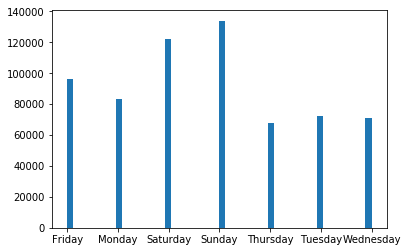

In [18]:
plt.hist(transaction.Weekday, bins=50)

In [19]:
df_tran_weekend = transaction.loc[transaction.Weekday.isin(['Saturday', 'Sunday'])]
df_tran_week = transaction.loc[transaction.Weekday.isin(['Monday', 'Tuesday','Wednesday', 'Thursday', 'Friday'])]
len(df_tran_weekend) # 256071
len(df_tran_week)    # 390983

390983

### VisitNumber
an id corresponding to a single trip by a single customer

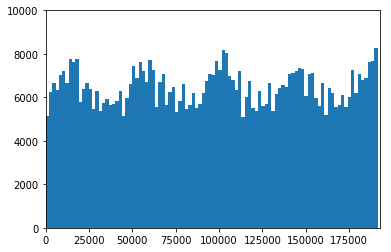

In [51]:
plt.hist(transaction.VisitNumber, bins=100)
plt.axis([0, 193000, 0, 10000])
plt.show()

In [34]:
transaction.VisitNumber.value_counts()

72439     209
88011     151
9181      113
60971     112
65792     111
80318     104
178154     98
181457     97
84786      97
59358      96
179810     94
78556      94
79977      94
143651     93
170029     93
97101      91
105804     91
92740      89
139425     89
74005      89
119639     89
49461      86
107756     86
145744     86
36506      86
58240      85
105052     84
55716      83
80051      82
94422      82
25479      82
128263     82
97397      80
185320     80
144059     80
13620      80
63881      80
117801     79
104328     79
185975     78
151256     78
84350      77
88395      77
163251     77
38978      77
101201     77
105764     77
189713     77
6754       76
39665      76
62309      76
55497      75
17432      74
44764      74
188217     74
71143      74
39043      73
136069     73
94755      73
5711       73
72656      73
79453      72
103604     72
145707     72
142033     72
31049      72
39643      72
106434     72
8250       71
13751      71
100468     71
153627

In [22]:
# COOK AND DINE	HOME MANAGEMENT	BATH AND SHOWER
df_tran_vn_72439 = transaction.loc[transaction.VisitNumber.isin(['72439'])]
df_tran_vn_72439.sort_values(by=['DepartmentDescription', 'ScanCount'], ascending=False)

,TripType,VisitNumber,Weekday,Upc,ScanCount,DepartmentDescription,FinelineNumber
244551,24,72439,Tuesday,6.053882e+10,2,SHOES,8960.0
244485,24,72439,Tuesday,6.053882e+10,1,SHOES,1909.0
244487,24,72439,Tuesday,6.053882e+10,1,SHOES,1909.0
244496,24,72439,Tuesday,6.053882e+10,1,SHOES,1909.0
244510,24,72439,Tuesday,7.232617e+10,1,SHOES,4820.0
244514,24,72439,Tuesday,6.053882e+10,1,SHOES,1910.0
244522,24,72439,Tuesday,6.053882e+10,1,SHOES,8960.0
244539,24,72439,Tuesday,6.053882e+10,1,SHOES,1909.0
244544,24,72439,Tuesday,1.292630e+09,1,SHOES,3387.0
244550,24,72439,Tuesday,7.232617e+10,1,SHOES,4820.0


In [23]:
df_tran_vn_72439 = df_tran_vn_72439.groupby(['DepartmentDescription', 'Upc', 'ScanCount'], as_index="DepartmentDescription")['ScanCount'].sum()
df_tran_vn_72439

## Upc 까지 동일한 아이템의 경우 ScanCount가 합산되지 않고 별도로 기록되는 이유가있나?
## 해당 visitNumber는 일반 소비자로 보기에는 힘들다. 생산자일 가능성

DepartmentDescription        Upc           ScanCount
BATH AND SHOWER              1.089259e+09   1           1
                                            1           1
                             1.089262e+09   1           1
                             4.269426e+09   2           2
                             4.796809e+09   5           5
                                            1           1
                             7.535392e+09   1           1
                             7.535394e+09   1           1
                             6.367650e+10   1           1
                             6.655380e+10   2           2
                             6.655382e+10   1           1
                             6.657211e+10   1           1
                                            1           1
                                            4           4
                                            1           1
                                            1           1
                   

In [24]:
df_tran_vn_88011 = transaction.loc[transaction.VisitNumber.isin(['88011'])]
df_tran_vn_88011.sort_values(by=['DepartmentDescription', 'ScanCount'], ascending=False)

,TripType,VisitNumber,Weekday,Upc,ScanCount,DepartmentDescription,FinelineNumber
292604,40,88011,Friday,6.053882e+10,1,SHOES,6318.0
292624,40,88011,Friday,7.464173e+10,1,SHOES,4936.0
292630,40,88011,Friday,6.053882e+10,1,SHOES,1914.0
292503,40,88011,Friday,2.015450e+10,1,SERVICE DELI,8001.0
292512,40,88011,Friday,7.143001e+09,1,PRODUCE,3601.0
292535,40,88011,Friday,4.046000e+03,1,PRODUCE,5620.0
292562,40,88011,Friday,4.011000e+03,1,PRODUCE,5501.0
292581,40,88011,Friday,4.051000e+03,1,PRODUCE,5701.0
292592,40,88011,Friday,4.135000e+03,1,PRODUCE,1214.0
292502,40,88011,Friday,3.004502e+10,1,PHARMACY OTC,2035.0


### ScanCount - the number of the given item that was purchased. A negative value indicates a product return.
가장 많은수량을 구매한 고객 == 가장 많이 반품을 한 고객  (71개 사서 12개 반품)
ScanCount 기준으로 몇개이상부터 생산자로 간주할수있을까. 10개이상?

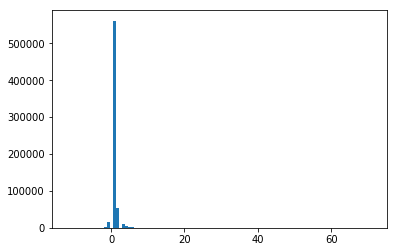

In [39]:
plt.hist(transaction.ScanCount, bins=100)
#plt.axis([-15, 75, 0, 1000])
#plt.figure(figsize=(10,5))
plt.show()

In [26]:
transaction.ScanCount.value_counts()

 1     561489
 2      53002
-1      14394
 3       9445
 4       4536
 5       1380
 6        866
-2        814
 8        246
 7        228
-3        143
 10       130
 9         88
-4         76
 12        60
 11        45
-5         16
 14        15
 13        13
 15        12
-6         10
 20         7
 16         6
 18         4
 24         4
 19         4
 25         3
 17         3
 23         3
 22         2
-9          2
 30         1
 46         1
 51         1
 71         1
-12         1
-10         1
-7          1
 31         1
Name: ScanCount, dtype: int64

In [52]:
df_tran_sc__12 = transaction.loc[transaction.ScanCount.isin(['-12'])]
df_tran_sc__12.sort_values(by=['DepartmentDescription', 'ScanCount'], ascending=False)

,TripType,VisitNumber,Weekday,Upc,ScanCount,DepartmentDescription,FinelineNumber,VisitNumberSum
124100,39,36866,Wednesday,4.178900e+09,-12,GROCERY DRY GOODS,3120.0,NaN


In [53]:
df_tran_sc_71 = transaction.loc[transaction.ScanCount.isin(['71'])]
df_tran_sc_71.sort_values(by=['DepartmentDescription', 'ScanCount'], ascending=False)

,TripType,VisitNumber,Weekday,Upc,ScanCount,DepartmentDescription,FinelineNumber,VisitNumberSum
478028,32,142397,Saturday,4.178900e+09,71,GROCERY DRY GOODS,3120.0,NaN


### DepartmentDescription
DepartmentDescription - a high-level description of the item's department

이웃한 카테고리들은 멀리떨어진 카테고리에 비해 유사성을 갖나?
왜 68개의 카테고리로 구분하였을까???

In [54]:
transaction.DepartmentDescription.value_counts()

GROCERY DRY GOODS              70402
DSD GROCERY                    68332
PRODUCE                        51115
DAIRY                          43820
PERSONAL CARE                  41969
IMPULSE MERCHANDISE            28712
HOUSEHOLD CHEMICALS/SUPP       24880
PHARMACY OTC                   23306
FROZEN FOODS                   21101
HOUSEHOLD PAPER GOODS          16274
COMM BREAD                     15244
BEAUTY                         14865
MENS WEAR                      12250
FINANCIAL SERVICES             10723
INFANT CONSUMABLE HARDLINES    10646
SERVICE DELI                   10127
CANDY, TOBACCO, COOKIES         9808
PETS AND SUPPLIES               9761
MEAT - FRESH & FROZEN           9477
PRE PACKED DELI                 9052
LADIESWEAR                      8721
CELEBRATION                     8698
COOK AND DINE                   7600
BAKERY                          7168
OFFICE SUPPLIES                 6578
HOME MANAGEMENT                 6349
TOYS                            6107
S

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  -1.0],
 <a list of 69 Text xticklabel objects>)

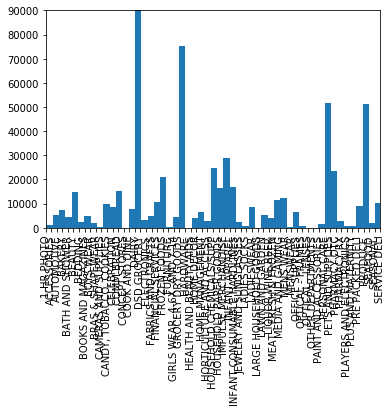

In [63]:
plt.hist(transaction.DepartmentDescription, bins=60)
plt.axis([0, 60, 0, 90000])
plt.xticks(rotation=90)

Upc - the UPC number of the product purchased
FinelineNumber - a more refined category for each of the products, created by Walmart